In [3]:
!pip install nltk
!pip install sklearn
!pip install matplotlib

     ---------------------------------------- 0.0/42.0 kB ? eta -:--:--
     --------- ------------------------------ 10.2/42.0 kB ? eta -:--:--
     ------------------ ------------------- 20.5/42.0 kB 217.9 kB/s eta 0:00:01
     --------------------------- ---------- 30.7/42.0 kB 262.6 kB/s eta 0:00:01
     -------------------------------------- 42.0/42.0 kB 253.9 kB/s eta 0:00:00
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ----- ---------------------------------- 0.2/1.5 MB 2.3 MB/s eta 0:00:01
   ---------------------------- ----------- 1.1/1.5 MB 8.6 MB/s eta 0:00:01
   ---------------------------------------- 1.5/1.5 MB 8.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/268.5 kB ? eta -:--:--
   ---------------------------------------- 268.5/268.5 kB 8.3 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'er

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [15 lines of output]
      The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
      rather than 'sklearn' for pip commands.
      
      Here is how to fix this error in the main use cases:
      - use 'pip install scikit-learn' rather than 'pip install sklearn'
      - replace 'sklearn' by 'scikit-learn' in your pip requirements files
        (requirements.txt, setup.py, setup.cfg, Pipfile, etc ...)
      - if the 'sklearn' package is used by one of your dependencies,
        it would be great if you take some time to track which package uses
        'sklearn' instead of 'scikit-learn' and report it to their issue tracker
      - as a last resort, set the environment variable
        SKLEARN_ALLOW_DEPRECATED_SKLEARN_PACKAGE_INSTALL=True to avoid this error
      
      More information is available at
      https://github.com/scikit-learn/sklearn-pypi-packag

# PCA

[nltk_data] Downloading package punkt to C:\Users\Naman
[nltk_data]     Bansal\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Naman
[nltk_data]     Bansal\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\Naman
[nltk_data]     Bansal\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


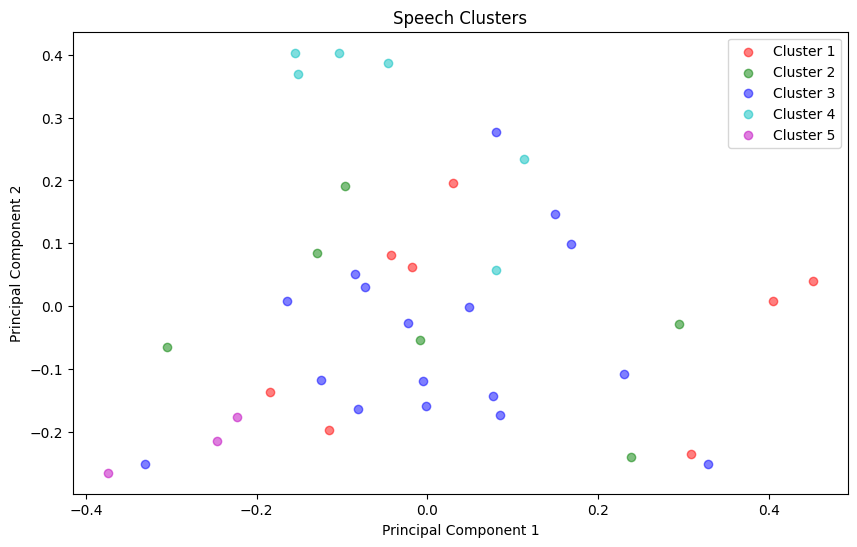

In [1]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import string
# Download NLTK data
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
data = pd.read_csv('50 Famous Speechs.csv', encoding='ISO-8859-1')
def preprocess_text(text):
    text = text.lower()
    text = text.translate(str.maketrans('', '', string.punctuation))
    tokens = word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    # Lemmatize the tokens
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    return ' '.join(tokens)
data['processed_speech'] = data['Speech'].apply(preprocess_text)
tfidf_vectorizer = TfidfVectorizer(max_features=1000)
tfidf_matrix = tfidf_vectorizer.fit_transform(data['processed_speech'])
num_clusters = 5 
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(tfidf_matrix)
pca = PCA(n_components=2)
tfidf_matrix_pca = pca.fit_transform(tfidf_matrix.toarray())
plt.figure(figsize=(10, 6))
colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k']
for i in range(num_clusters):
    cluster_data = tfidf_matrix_pca[kmeans.labels_ == i]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], c=colors[i], label=f'Cluster {i+1}', alpha=0.5)
plt.title('Speech Clusters')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()


In [17]:
# Top terms in each cluster
def print_top_terms(tfidf_matrix, cluster_labels, num_clusters, vectorizer, num_terms=10):
    order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
    terms = vectorizer.get_feature_names_out()
    for i in range(num_clusters):
        print(f"Cluster {i+1}:")
        for ind in order_centroids[i, :num_terms]:
            print(f' {terms[ind]}')
        print()

print_top_terms(tfidf_matrix, kmeans.labels_, num_clusters, tfidf_vectorizer)


Cluster 1:
 woman
 risk
 men
 history
 could
 world
 human
 ask
 generation
 ain

Cluster 2:
 black
 white
 woman
 word
 whether
 nationalist
 position
 silence
 ll
 people

Cluster 3:
 shall
 day
 freedom
 much
 people
 every
 war
 party
 world
 nation

Cluster 4:
 hope
 would
 like
 rise
 young
 may
 people
 feeling
 let
 man

Cluster 5:
 future
 army
 past
 interest
 defender
 next
 space
 finite
 show
 hundred



In [18]:
# Examine the principal components
pca_components = pca.components_
terms = tfidf_vectorizer.get_feature_names_out()
for i, component in enumerate(pca_components):
    terms_in_component = sorted(zip(component, terms), key=lambda x: x[0], reverse=True)[:10]
    print(f"Principal Component {i+1}:")
    for value, term in terms_in_component:
        print(f" {term} ({value:.4f})")
    print()



Principal Component 1:
 woman (0.4338)
 much (0.1485)
 ain (0.1286)
 die (0.1198)
 shall (0.1139)
 live (0.1136)
 together (0.1115)
 ever (0.1083)
 could (0.1057)
 attempt (0.1002)

Principal Component 2:
 hope (0.3201)
 like (0.2588)
 rise (0.2396)
 would (0.1866)
 young (0.1315)
 don (0.0991)
 day (0.0938)
 ask (0.0900)
 belief (0.0898)
 american (0.0856)



In [11]:
!pip install wordcloud

   ---------------------------------------- 0.0/301.4 kB ? eta -:--:--
   - -------------------------------------- 10.2/301.4 kB ? eta -:--:--
   --- ----------------------------------- 30.7/301.4 kB 660.6 kB/s eta 0:00:01
   --------------------------- ------------ 204.8/301.4 kB 2.5 MB/s eta 0:00:01
   ---------------------------------------- 301.4/301.4 kB 2.7 MB/s eta 0:00:00


# Word Cloud

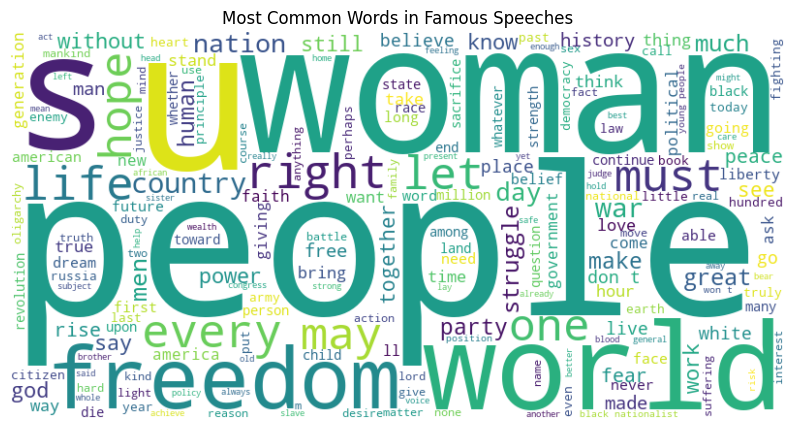

In [12]:
from wordcloud import WordCloud
data['processed_speech'] = data['Speech'].apply(preprocess_text)
all_speeches = ' '.join(data['processed_speech'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_speeches)


plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most Common Words in Famous Speeches')
plt.show()

As we can see the words that are most often used in speeches are: People,Woman,Freedom and World. The other words that caught my attention were :" right","life" and especially 'must'.
The use of a simple word like "must"  , in my opinion, signifies how politicians force people to believe what they want them to, and act only the way the politicians deems correct and that too, urgently.

Also we can see,while the speeches were recorded at different times, different centuries infact, the themes that drew human attention ,the issues that were raised, remained somewhat consistent. In the end, this basically tells us what matters the most in politics,the "people".

In [14]:
!pip install transformers torch

     ---------------------------------------- 0.0/43.8 kB ? eta -:--:--
     --------- ------------------------------ 10.2/43.8 kB ? eta -:--:--
     -------------------------- ----------- 30.7/43.8 kB 330.3 kB/s eta 0:00:01
     -------------------------------------- 43.8/43.8 kB 430.5 kB/s eta 0:00:00
   ---------------------------------------- 0.0/9.1 MB ? eta -:--:--
   --- ------------------------------------ 0.7/9.1 MB 14.8 MB/s eta 0:00:01
   ---- ----------------------------------- 1.1/9.1 MB 17.4 MB/s eta 0:00:01
   ---- ----------------------------------- 1.1/9.1 MB 17.4 MB/s eta 0:00:01
   ---- ----------------------------------- 1.1/9.1 MB 17.4 MB/s eta 0:00:01
   ---- ----------------------------------- 1.1/9.1 MB 17.4 MB/s eta 0:00:01
   ---- ----------------------------------- 1.1/9.1 MB 17.4 MB/s eta 0:00:01
   ---- ----------------------------------- 1.1/9.1 MB 3.8 MB/s eta 0:00:03
   ----- ---------------------------------- 1.1/9.1 MB 3.3 MB/s eta 0:00:03
   ----- ---

In [17]:
!pip install tf-keras

   ---------------------------------------- 0.0/1.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.7 MB ? eta -:--:--
    --------------------------------------- 0.0/1.7 MB 495.5 kB/s eta 0:00:04
   ------------ --------------------------- 0.5/1.7 MB 4.7 MB/s eta 0:00:01
   ------------------------------ --------- 1.3/1.7 MB 9.3 MB/s eta 0:00:01
   ---------------------------------------- 1.7/1.7 MB 10.0 MB/s eta 0:00:00


# Extracting leaders names from the title

In [21]:
!pip install spacy

   ---------------------------------------- 0.0/11.7 MB ? eta -:--:--
    --------------------------------------- 0.2/11.7 MB 5.3 MB/s eta 0:00:03
   --- ------------------------------------ 1.0/11.7 MB 13.0 MB/s eta 0:00:01
   ------ --------------------------------- 1.8/11.7 MB 14.0 MB/s eta 0:00:01
   ------ --------------------------------- 2.0/11.7 MB 12.7 MB/s eta 0:00:01
   -------- ------------------------------- 2.4/11.7 MB 10.8 MB/s eta 0:00:01
   --------- ------------------------------ 2.7/11.7 MB 9.9 MB/s eta 0:00:01
   --------- ------------------------------ 2.8/11.7 MB 9.0 MB/s eta 0:00:01
   ---------- ----------------------------- 2.9/11.7 MB 8.2 MB/s eta 0:00:02
   ---------- ----------------------------- 3.0/11.7 MB 7.7 MB/s eta 0:00:02
   ---------- ----------------------------- 3.1/11.7 MB 7.0 MB/s eta 0:00:02
   ---------- ----------------------------- 3.2/11.7 MB 6.5 MB/s eta 0:00:02
   ----------- ---------------------------- 3.3/11.7 MB 6.0 MB/s eta 0:00:02
  

In [23]:
!python -m spacy download en_core_web_sm

     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     --------------------------------------- 0.0/12.8 MB 245.8 kB/s eta 0:00:52
     --------------------------------------- 0.1/12.8 MB 297.7 kB/s eta 0:00:43
     --------------------------------------- 0.1/12.8 MB 375.8 kB/s eta 0:00:34
     --------------------------------------- 0.1/12.8 MB 450.6 kB/s eta 0:00:29
      -------------------------------------- 0.3/12.8 MB 886.2 kB/s eta 0:00:15
      -------------------------------------- 0.3/12.8 MB 905.4 kB/s eta 0:00:14
     -- ------------------------------------- 0.6/12.8 MB 1.6 MB/s eta 0:00:08
     -- ------------------------------------- 0.6/12.8 MB 1.6 MB/s eta 0:00:08
     --- ------------------------------------ 1.2/12.8 MB 2.3 MB/s eta 0:00:05
     --- ------------------------------------ 1.2/12.8 MB 2.3 MB/s 

In [28]:
import spacy
nlp = spacy.load("en_core_web_sm")
def extract_speaker(title):
    doc = nlp(title)
    for ent in doc.ents:
        if ent.label_ == 'PERSON': 
            return ent.text
    return None
data['speaker'] = data['Title of the Speech'].apply(lambda title: extract_speaker(str(title)))
output_csv = 'updated_speeches.csv'
data.to_csv(output_csv, index=False)
print(f"Updated CSV saved to: {output_csv}")


Updated CSV saved to: updated_speeches.csv


In [14]:
data=pd.read_csv("updated_speeches.csv", encoding='ISO-8859-1')

# Individual Analysis

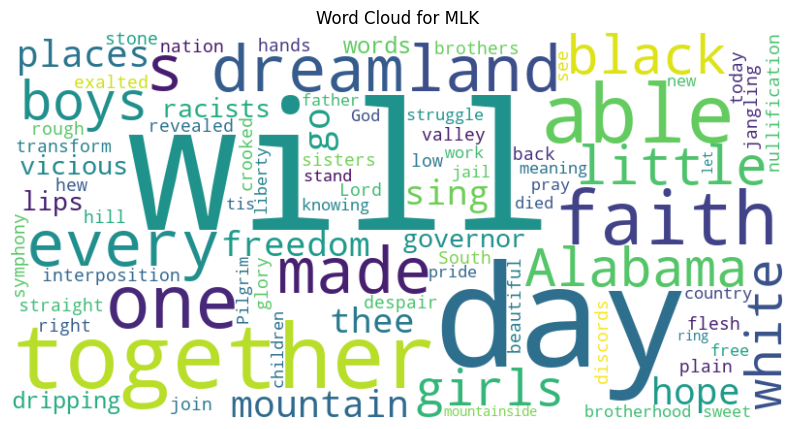

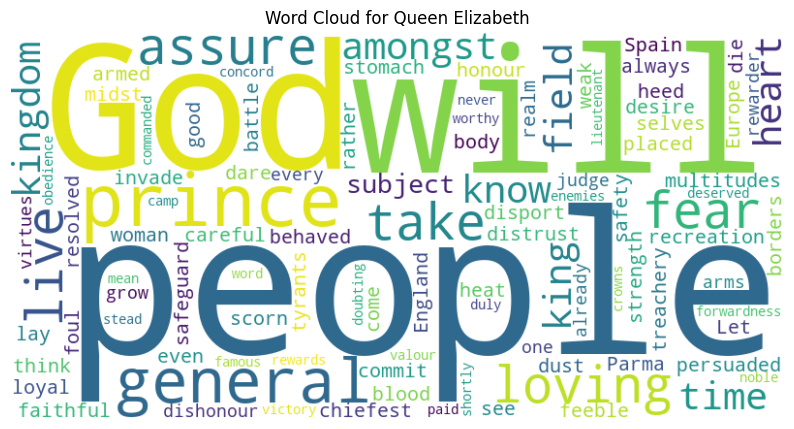

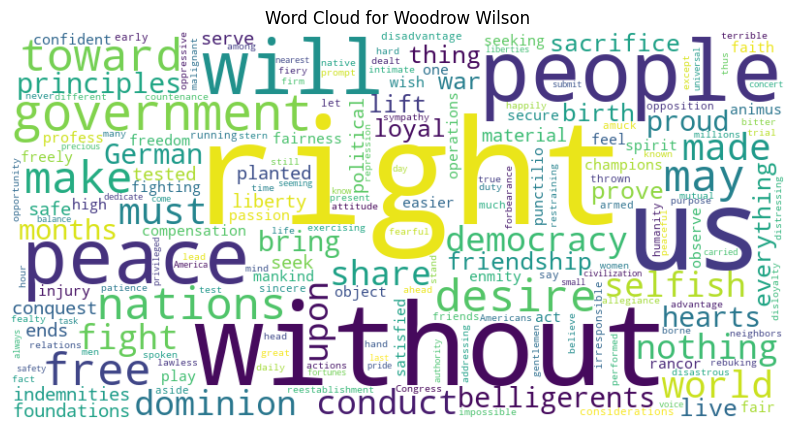

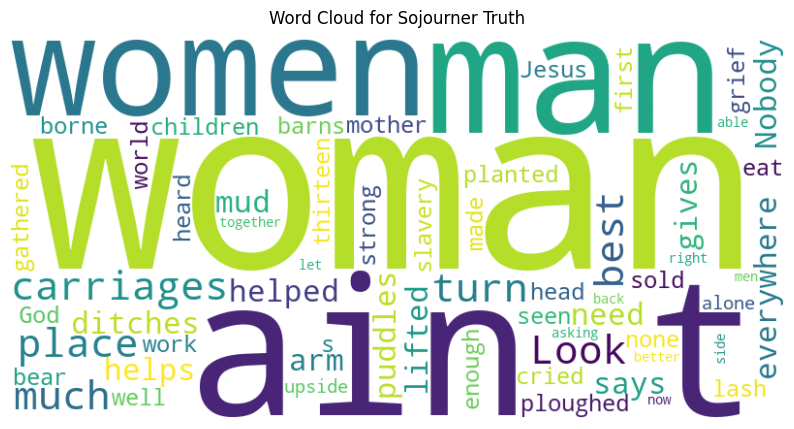

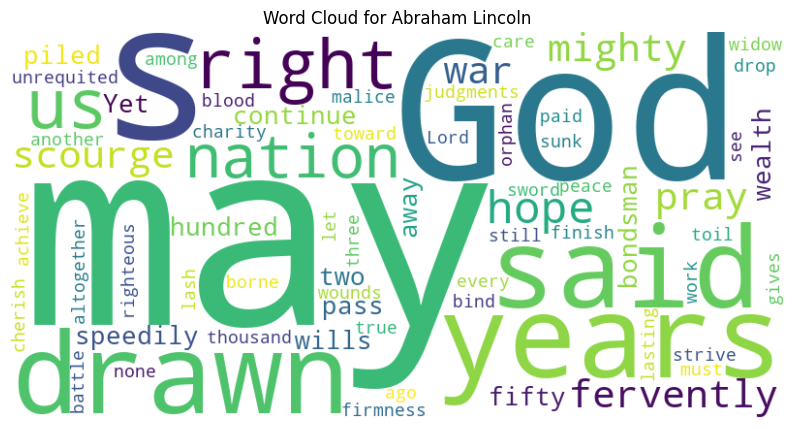

...

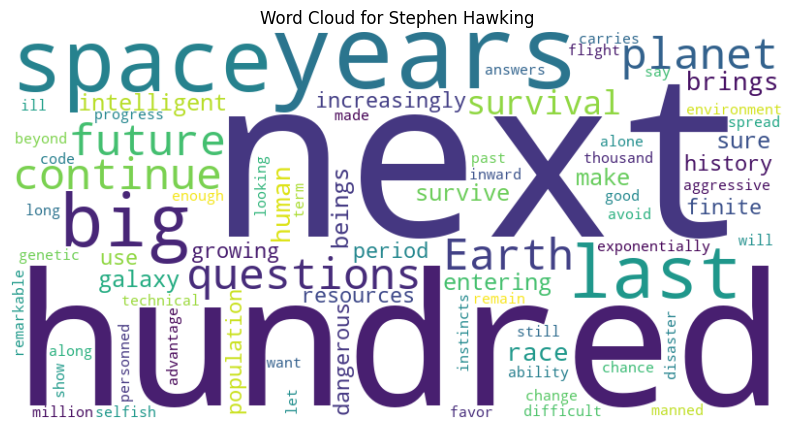

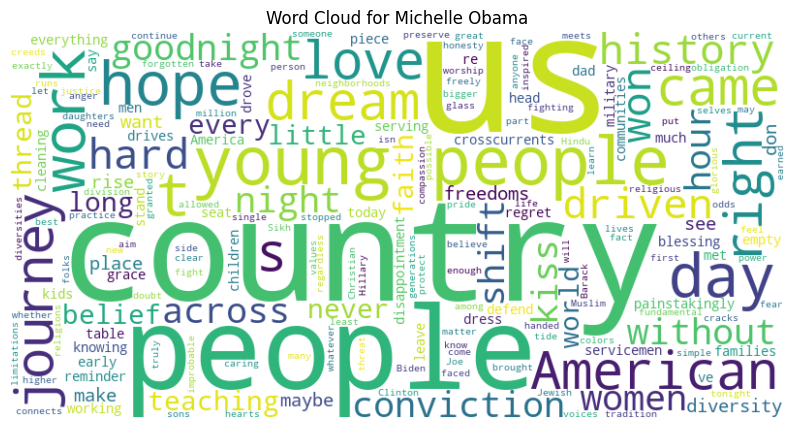

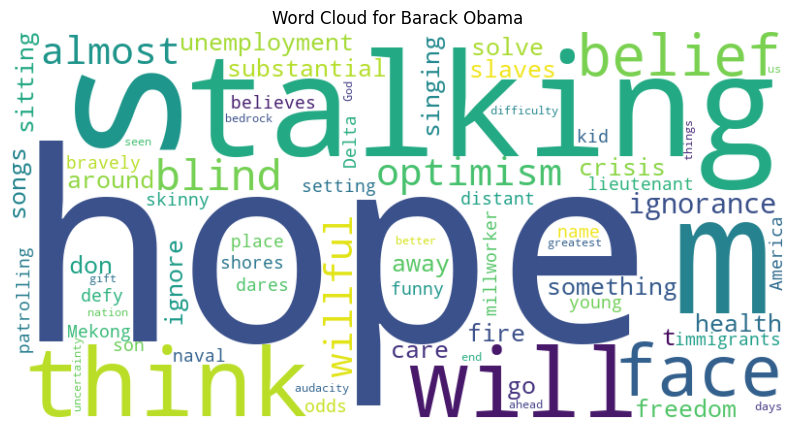

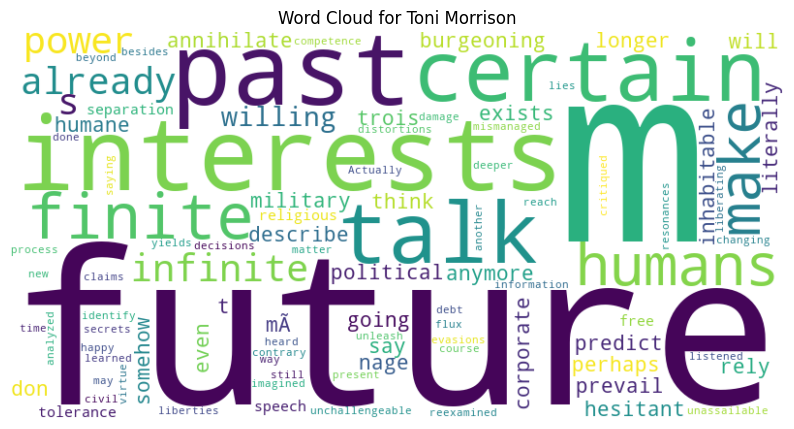

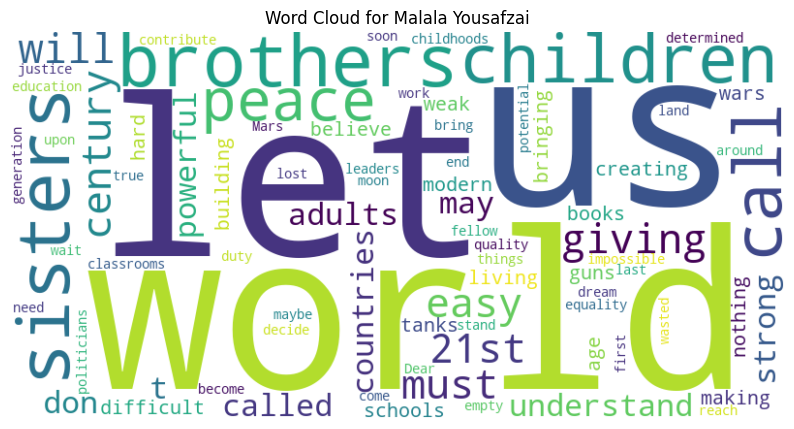

In [15]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
def preprocess_text(text):
    
    words = text.split()
    if len(words) > 1:
        return ' '.join(words[1:])  
    else:
        return '' 
unique_speakers = data['speaker'].unique()
for speaker in unique_speakers:
    speeches = data[data['speaker'] == speaker]['Speech']
    preprocessed_speeches = speeches.apply(preprocess_text)
    all_text = ' '.join(preprocessed_speeches)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {speaker}')
    plt.axis('off')
    plt.show()



The individual wordclouds for each louder explicitly provides the main themes of their respective speeches. For example we can see while Mahatma Gandhi focused on freedom, Aung San focused more on cinemas, and mother Teresa on Love. This clearly tells us what were the main talking points of the leaders in their most iconic speeches, while also telling us what are the themes that draw people's attention. It provides the issues that were raised from one point in time to other,and how they are similar to each other , while being different as well.

# Left vs Right

Here I am trying to analyze the words most used by right and left leaning parties. Although, I believe that better terms can be liberal and conservatives, because it is not going to differentiate on the basis of economic policy of capitalism vs socialism. This can be somewhat controversial as well because one speech is not enough to judge a person, and neither do I have any idea about the views they held. SO I am just going to provide a couple of sentences to caculate the similarity and get wordclouds of the same.

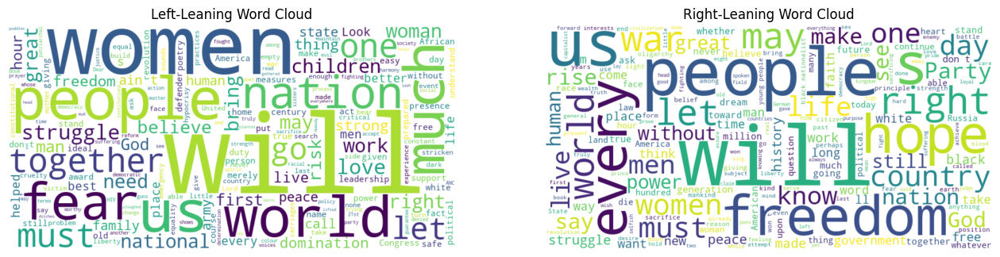

In [19]:
from sklearn.metrics.pairwise import cosine_similarity

data['speaker'] = data['speaker'].apply(lambda x: x.encode('ascii', 'ignore').decode('ascii'))

left_texts = [
    "Equality for all, support social welfare programs, and environmental protection.",
    "Progressive policies are essential to reduce inequality and promote social justice.",
    "Free and equal"
]
right_texts = [
    "We believe in personal responsibility, limited government, and free market principles",
    "Strong national defense and preserving family structures",
    "Country and patriotism"
]

all_texts = data['Speech'].tolist() + left_texts + right_texts
vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(all_texts)

# Compute cosine similarity
similarity_matrix = cosine_similarity(tfidf_matrix)
left_vector = similarity_matrix[:-2, -2]
right_vector = similarity_matrix[:-2, -1]
left_vector = left_vector[:len(data)]
right_vector = right_vector[:len(data)]
data['Ideology'] = np.where(left_vector > right_vector, 'Left', 'Right')
# Visualize the word clouds
from wordcloud import WordCloud
import matplotlib.pyplot as plt
left_speeches = ' '.join(data[data['Ideology'] == 'Left']['Speech'])
right_speeches = ' '.join(data[data['Ideology'] == 'Right']['Speech'])
left_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(left_speeches)
right_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(right_speeches)
plt.figure(figsize=(16, 8))

plt.subplot(1, 2, 1)
plt.imshow(left_wordcloud, interpolation='bilinear')
plt.title('Left-Leaning Word Cloud')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(right_wordcloud, interpolation='bilinear')
plt.title('Right-Leaning Word Cloud')
plt.axis('off')

plt.show()


In [ ]:

print(data[['speaker', 'Ideology']])